# RPM vs Speed
- This notebook will plot the RPM vs Moving Speed for all possible trains
- Additionally 

In [6]:
import pandas as pd
import os
import warnings
import seaborn as sns 
import matplotlib.pyplot as plt 
import sys

# Filter out warnings
warnings.filterwarnings("ignore")

# Data Casting
sys.path.append('../../')
from cool_train.data_loading import correct_column_types


In [7]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [8]:
trains_new_dataset = [107, 131, 136, 172, 181, 194]

dict_trains = {}

date_string = '20231207'

main_folder_path = '../../dataset/'

subfolders = [f.path for f in os.scandir(main_folder_path) if f.is_dir() and date_string in f.name and "tbl_AR41" in f.name]


for jj, subfolder in enumerate(subfolders):
    files = [f.path for f in os.scandir(subfolder) if f.is_file()]
    file_path = files[0]
    raw_data = pd.read_csv(file_path, sep=';')
    dict_trains[trains_new_dataset[jj]] = raw_data

In [9]:
train = 136


df = dict_trains[train]

In [10]:
# Drop useless columns
useless_cols = ['IsInvalidLine', 'IsTreated', 'ID_Org','id','vehicle_id','Insert_Datetime','mapped_veh_id_Org','Is_Meteo_Retrieved']

df = df.drop(useless_cols, axis=1)
df 

,timestamps_UTC,lat,lon,temperature,elevation,precipitations,snow_height,RS_E_InAirTemp_PC1,RS_E_InAirTemp_PC2,RS_E_OilPress_PC1,...,RS_E_InAirTemp_Delta,RS_E_InAirTemp_Delta_Percent,RS_E_OilPress_Delta,RS_E_OilPress_Delta_Percent,RS_E_RPM_Delta,RS_E_RPM_Delta_Percent,RS_E_WatTemp_Delta,RS_E_WatTemp_Delta_Percent,RS_T_OilTemp_Delta,RS_T_OilTemp_Delta_Percent
0,2023-01-23 08:26:04.000,51.038378,5.280001,"0,123500004",37,0,"0,039999999",38,35,182,...,3,"7,894736842",508,"279,1208791",6,"0,737100737",2,"2,272727273",5,"5,747126437"
1,2023-01-23 08:27:04.000,51.038391,5.279761,"0,123500004",37,0,"0,039999999",39,35,365,...,4,"10,25641026",325,"89,04109589",3,"0,194174757",0,0,2,"2,325581395"
2,2023-01-23 08:28:04.000,51.039809,5.265581,"0,136500001",35,0,"0,039999999",46,42,345,...,4,"8,695652174",345,100,13,"0,749711649",0,0,0,0
3,2023-01-23 08:28:05.000,51.039767,5.265853,"0,136500001",35,0,"0,039999999",46,45,341,...,1,"2,173913043",349,"102,3460411",19,"1,161369193",0,0,0,0
4,2023-01-23 08:29:05.000,51.047337,5.243465,"0,173999995",33,0,"0,029999999",39,38,360,...,1,"2,564102564",330,"91,66666667",3,"0,199933356","3,5","4,268292683","3,5","4,21686747"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
374972,2023-09-13 21:45:47.000,50.936613,5.306404,"18,22599983",38,0,0,21,47,0,...,26,"123,8095238",6,NaN,0,NaN,41,205,43,"252,9411765"
374973,2023-09-13 21:46:28.000,50.936764,5.305734,"18,22599983",38,0,0,21,47,0,...,26,"123,8095238",6,NaN,0,NaN,41,205,43,"252,9411765"
374974,2023-09-13 21:46:47.000,50.936577,5.306441,"18,22599983",38,0,0,21,47,0,...,26,"123,8095238",6,NaN,0,NaN,41,205,42,"233,3333333"
374975,2023-09-13 21:47:29.000,50.936786,5.305697,"18,22599983",38,0,0,21,48,0,...,27,"128,5714286",6,NaN,0,NaN,41,205,43,"268,75"


In [11]:
df = correct_column_types(df)
df

,timestamps_UTC,lat,lon,temperature,elevation,precipitations,snow_height,RS_E_InAirTemp_PC1,RS_E_InAirTemp_PC2,RS_E_OilPress_PC1,...,RS_E_InAirTemp_Delta,RS_E_InAirTemp_Delta_Percent,RS_E_OilPress_Delta,RS_E_OilPress_Delta_Percent,RS_E_RPM_Delta,RS_E_RPM_Delta_Percent,RS_E_WatTemp_Delta,RS_E_WatTemp_Delta_Percent,RS_T_OilTemp_Delta,RS_T_OilTemp_Delta_Percent
0,2023-01-23 08:26:04,51.038378,5.280001,0.1235,37.0,0.0,0.04,38.0,35.0,182.0,...,3.0,7.894737,508.0,279.120879,6.0,0.737101,2.0,2.272727,5.0,5.747126
1,2023-01-23 08:27:04,51.038391,5.279761,0.1235,37.0,0.0,0.04,39.0,35.0,365.0,...,4.0,10.256410,325.0,89.041096,3.0,0.194175,0.0,0.000000,2.0,2.325581
2,2023-01-23 08:28:04,51.039809,5.265581,0.1365,35.0,0.0,0.04,46.0,42.0,345.0,...,4.0,8.695652,345.0,100.000000,13.0,0.749712,0.0,0.000000,0.0,0.000000
3,2023-01-23 08:28:05,51.039767,5.265853,0.1365,35.0,0.0,0.04,46.0,45.0,341.0,...,1.0,2.173913,349.0,102.346041,19.0,1.161369,0.0,0.000000,0.0,0.000000
4,2023-01-23 08:29:05,51.047337,5.243465,0.1740,33.0,0.0,0.03,39.0,38.0,360.0,...,1.0,2.564103,330.0,91.666667,3.0,0.199933,3.5,4.268293,3.5,4.216867
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
374972,2023-09-13 21:45:47,50.936613,5.306404,18.2260,38.0,0.0,0.00,21.0,47.0,0.0,...,26.0,123.809524,6.0,NaN,0.0,NaN,41.0,205.000000,43.0,252.941177
374973,2023-09-13 21:46:28,50.936764,5.305734,18.2260,38.0,0.0,0.00,21.0,47.0,0.0,...,26.0,123.809524,6.0,NaN,0.0,NaN,41.0,205.000000,43.0,252.941177
374974,2023-09-13 21:46:47,50.936577,5.306441,18.2260,38.0,0.0,0.00,21.0,47.0,0.0,...,26.0,123.809524,6.0,NaN,0.0,NaN,41.0,205.000000,42.0,233.333333
374975,2023-09-13 21:47:29,50.936786,5.305697,18.2260,38.0,0.0,0.00,21.0,48.0,0.0,...,27.0,128.571429,6.0,NaN,0.0,NaN,41.0,205.000000,43.0,268.750000


In [12]:
# Filter Out of Range Values
df = df[df['OutOfRange_NB_PC1'] == 0]
df = df[df['OutOfRange_NB_PC2'] == 0]
df 

,timestamps_UTC,lat,lon,temperature,elevation,precipitations,snow_height,RS_E_InAirTemp_PC1,RS_E_InAirTemp_PC2,RS_E_OilPress_PC1,...,RS_E_InAirTemp_Delta,RS_E_InAirTemp_Delta_Percent,RS_E_OilPress_Delta,RS_E_OilPress_Delta_Percent,RS_E_RPM_Delta,RS_E_RPM_Delta_Percent,RS_E_WatTemp_Delta,RS_E_WatTemp_Delta_Percent,RS_T_OilTemp_Delta,RS_T_OilTemp_Delta_Percent
1594,2023-01-23 22:00:57,51.215928,4.421040,0.5545,19.0,0.0,0.01,0.0,0.0,0.0,...,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,0.000000
1595,2023-01-23 22:00:59,51.216517,4.420929,0.6195,9.0,0.0,0.01,0.0,0.0,0.0,...,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,2.0,2.631579
1596,2023-01-23 22:01:16,51.215910,4.421045,0.5545,19.0,0.0,0.01,0.0,0.0,0.0,...,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,1.0,1.298701
1597,2023-01-23 22:01:19,51.216522,4.420893,0.6195,9.0,0.0,0.01,27.0,32.0,3.0,...,5.0,18.518519,580.0,19333.33333,0.0,NaN,0.0,0.0,0.0,0.000000
1598,2023-01-23 22:02:16,51.215882,4.421020,0.5545,19.0,0.0,0.01,35.0,40.0,3.0,...,5.0,14.285714,576.0,19200.00000,0.0,NaN,0.0,0.0,3.0,4.054054
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
374972,2023-09-13 21:45:47,50.936613,5.306404,18.2260,38.0,0.0,0.00,21.0,47.0,0.0,...,26.0,123.809524,6.0,NaN,0.0,NaN,41.0,205.0,43.0,252.941177
374973,2023-09-13 21:46:28,50.936764,5.305734,18.2260,38.0,0.0,0.00,21.0,47.0,0.0,...,26.0,123.809524,6.0,NaN,0.0,NaN,41.0,205.0,43.0,252.941177
374974,2023-09-13 21:46:47,50.936577,5.306441,18.2260,38.0,0.0,0.00,21.0,47.0,0.0,...,26.0,123.809524,6.0,NaN,0.0,NaN,41.0,205.0,42.0,233.333333
374975,2023-09-13 21:47:29,50.936786,5.305697,18.2260,38.0,0.0,0.00,21.0,48.0,0.0,...,27.0,128.571429,6.0,NaN,0.0,NaN,41.0,205.0,43.0,268.750000


In [13]:
df.columns 

Index(['timestamps_UTC', 'lat', 'lon', 'temperature', 'elevation',
       'precipitations', 'snow_height', 'RS_E_InAirTemp_PC1',
       'RS_E_InAirTemp_PC2', 'RS_E_OilPress_PC1', 'RS_E_OilPress_PC2',
       'RS_E_RPM_PC1', 'RS_E_RPM_PC2', 'RS_E_WatTemp_PC1', 'RS_E_WatTemp_PC2',
       'RS_T_OilTemp_PC1', 'RS_T_OilTemp_PC2', 'Sensors_NB_Fail_PC1',
       'Sensors_NB_Fail_PC2', 'OutOfRange_NB_PC1', 'OutOfRange_NB_PC2',
       'Distance', 'IsMoving', 'MovingSpeed', 'Slope', 'VerticalDisplacement',
       'RS_E_InAirTemp_Delta', 'RS_E_InAirTemp_Delta_Percent',
       'RS_E_OilPress_Delta', 'RS_E_OilPress_Delta_Percent', 'RS_E_RPM_Delta',
       'RS_E_RPM_Delta_Percent', 'RS_E_WatTemp_Delta',
       'RS_E_WatTemp_Delta_Percent', 'RS_T_OilTemp_Delta',
       'RS_T_OilTemp_Delta_Percent'],
      dtype='object')

In [14]:
variables = ['temperature','elevation','RS_E_RPM_PC1','RS_E_InAirTemp_PC1','RS_E_WatTemp_PC1','RS_T_OilTemp_PC1','MovingSpeed','Slope','VerticalDisplacement']

df_sel = df[variables]

for column in df_sel.columns:
    if df_sel[column].dtype == 'object':
        df_sel[column] = pd.to_numeric(df_sel[column].str.replace(',', '.'), errors='coerce')


df_sel

,temperature,elevation,RS_E_RPM_PC1,RS_E_InAirTemp_PC1,RS_E_WatTemp_PC1,RS_T_OilTemp_PC1,MovingSpeed,Slope,VerticalDisplacement
1594,0.5545,19.0,0.0,0.0,0.0,78.0,6.401295,0.147996,0.263158
1595,0.6195,9.0,0.0,0.0,0.0,76.0,120.946438,-0.148826,-5.000000
1596,0.5545,19.0,0.0,0.0,0.0,77.0,14.228993,0.148826,0.588235
1597,0.6195,9.0,0.0,27.0,80.0,77.0,81.083066,-0.147996,-3.333333
1598,0.5545,19.0,0.0,35.0,80.0,74.0,4.254734,0.148441,0.175439
...,...,...,...,...,...,...,...,...,...
374972,18.2260,38.0,0.0,21.0,20.0,17.0,10.928602,0.000000,0.000000
374973,18.2260,38.0,0.0,21.0,20.0,17.0,4.573537,0.000000,0.000000
374974,18.2260,38.0,0.0,21.0,20.0,18.0,10.353412,0.000000,0.000000
374975,18.2260,38.0,0.0,21.0,20.0,16.0,4.849336,0.000000,0.000000


In [15]:
# Get the top 10 correlated variable pairs
top_correlations = df_sel.corr().unstack().sort_values(ascending=False).drop_duplicates()[1:20]

# Display the result
print(f"Top 10 correlated variable pairs: Train {train}")
print(top_correlations)

Top 10 correlated variable pairs: Train 136
RS_T_OilTemp_PC1      RS_E_WatTemp_PC1      0.857249
temperature           RS_E_InAirTemp_PC1    0.660614
RS_T_OilTemp_PC1      RS_E_RPM_PC1          0.369723
RS_E_RPM_PC1          RS_E_WatTemp_PC1      0.356614
RS_T_OilTemp_PC1      RS_E_InAirTemp_PC1    0.314238
RS_E_WatTemp_PC1      RS_E_InAirTemp_PC1    0.222593
VerticalDisplacement  Slope                 0.219141
RS_E_RPM_PC1          RS_E_InAirTemp_PC1    0.196916
                      MovingSpeed           0.117021
RS_E_InAirTemp_PC1    MovingSpeed           0.067910
MovingSpeed           RS_T_OilTemp_PC1      0.067318
VerticalDisplacement  elevation             0.052502
RS_E_WatTemp_PC1      MovingSpeed           0.049531
RS_T_OilTemp_PC1      temperature           0.045733
RS_E_WatTemp_PC1      temperature           0.045648
Slope                 elevation             0.024091
RS_E_RPM_PC1          elevation             0.009572
RS_E_InAirTemp_PC1    Slope                 0.001505
RS

In [16]:
df_sel['Moving']

KeyError: 'Moving'

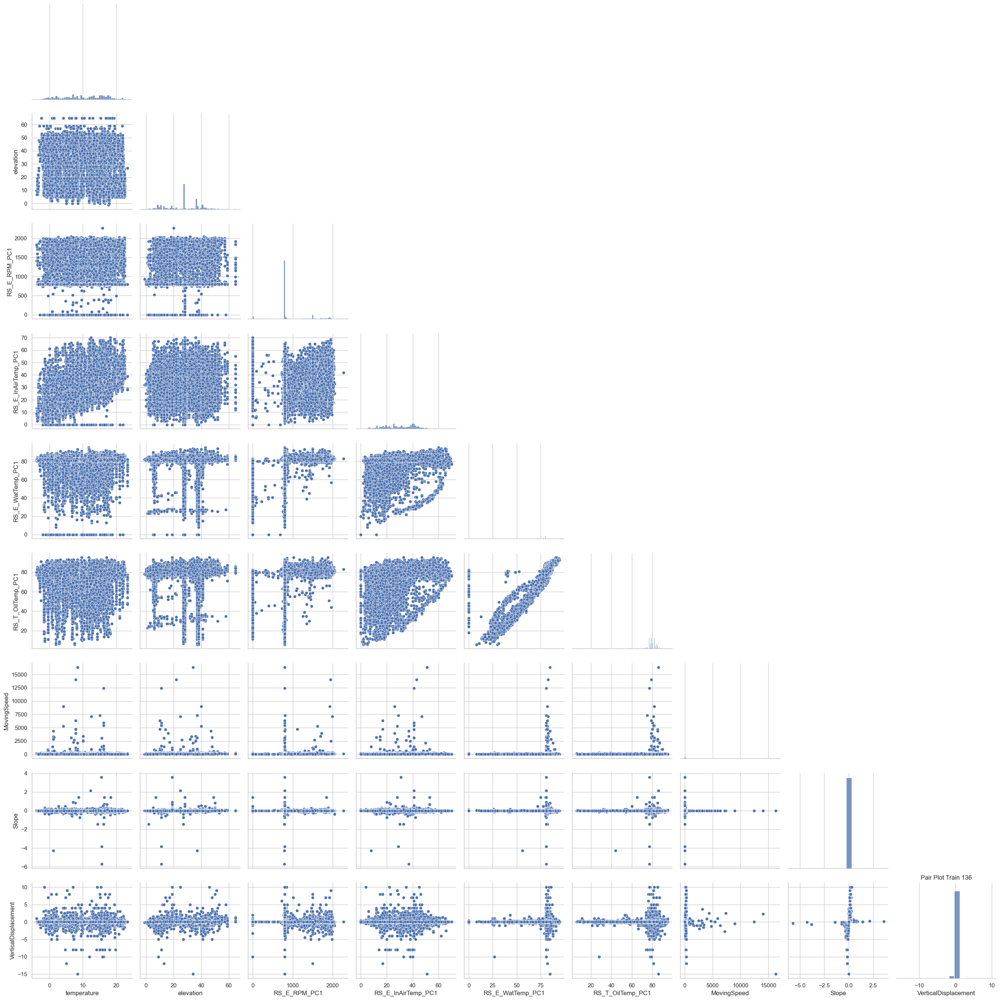

In [ ]:
# Subsample data
df_sampled = df_sel.sample(frac=0.1, random_state=1)

sns.set(style="whitegrid")
sns.pairplot(df_sampled, height=3, aspect=1,corner=True)
plt.title(f'Pair Plot Train {train}')
plt.tight_layout()
plt.show()




# Remove unnecessary points
- Is there a correlation between RPM (without 800) and Moving Speed ?
- Is there a correlation between RPM (without 800) and Slope ?
- Is there a correlation between 

In [ ]:
import pandas as pd
import plotly.subplots as sp
import plotly.graph_objects as go

df_sel = df 

# Function to remove outliers using IQR
def remove_outliers(data, column, multiplier=1):
    Q1 = data[column].quantile(0.05)
    Q3 = data[column].quantile(0.95)
    IQR = Q3 - Q1
    lower_bound = Q1 - multiplier * IQR
    upper_bound = Q3 + multiplier * IQR
    return data[(data[column] >= lower_bound) & (data[column] <= upper_bound)]


# Check the size of the DataFrame
num_rows, num_columns = df_sel.shape

# Set a threshold for the number of points beyond which you want to subsample
threshold_rows = 20000

# Check the size of the DataFrame
num_rows, num_columns = df_sel.shape

if num_rows < threshold_rows:
    # If the number of rows is less than the threshold, use the entire DataFrame
    df_sample = df_sel.sample(n=num_rows // num_columns * num_columns)
else:
    # If the number of points is too large, subsample the DataFrame
    df_sample = df_sel.sample(n=threshold_rows)

# Create subplots in a 7x7 grid
fig = sp.make_subplots(rows=len(df_sel.columns)//4, cols=4, subplot_titles=list(df_sample.columns))

# Populate subplots with histograms after removing outliers
for i, column in enumerate(df_sample.columns, 1):
    row_num = (i - 1) // 4 + 1
    col_num = (i - 1) % 4 + 1
    # Remove outliers using IQR
    outliers_rem = True 
    if outliers_rem:
        df_no_outliers = remove_outliers(df_sample, column)
    else: 
        df_no_outliers = df_sample
        
        
    hist_data = df_no_outliers[column]
    histogram = go.Histogram(x=hist_data, nbinsx=100, name=column)
    fig.add_trace(histogram, row=row_num, col=col_num)


# Update layout
fig.update_layout(
    title_text="Histograms for Each Variable",
    showlegend=False,
    height=2000, 
    width=1000  
)
# Show the plot
fig.show()

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 374977 entries, 0 to 374976
Data columns (total 36 columns):
 #   Column                        Non-Null Count   Dtype         
---  ------                        --------------   -----         
 0   timestamps_UTC                374977 non-null  datetime64[ns]
 1   lat                           374977 non-null  float64       
 2   lon                           374977 non-null  float64       
 3   temperature                   374977 non-null  float64       
 4   elevation                     374977 non-null  float64       
 5   precipitations                374977 non-null  float64       
 6   snow_height                   374977 non-null  float64       
 7   RS_E_InAirTemp_PC1            374977 non-null  float64       
 8   RS_E_InAirTemp_PC2            374977 non-null  float64       
 9   RS_E_OilPress_PC1             374977 non-null  float64       
 10  RS_E_OilPress_PC2             374977 non-null  float64       
 11  RS_E_RPM_PC1 

# Distribution of features based on REgime or Not
Lets define Regime:
- Regime Stopped: RPM1 and RPM2 = 0
- Regime Cruising: RPM1 = RPM2 = 800
- Regime High Speed: RPM1 > 800 and RPM1 > 800
- Regime One Engine Deccelerating: RPM1 = 800 and RPM2 < 800 OR Regime 5: RPM2 = 800 and RPM1 < 800
- Regime One Engine Accelerating: RPM2 = 800 and RPM1 > 800 OR Regime 4: RPM1 = 800 and RPM2 > 800
- Regime Both Engine Deccelerating: RPM2 <800 and RPM1 <800 AND not stoped


In [60]:
# Load the clean + added feature dataset
df_time = pd.read_csv('../../dataset/df_final_train136.csv', index_col=['timestamps_UTC'])

In [61]:
# Define Regimes
# Create a new 'Regime' column based on the specified conditions
df_time['Regime'] = 'Other Case'
df_time.loc[(df_time['RS_E_RPM_PC1'] >= 790) & (df_time['RS_E_RPM_PC1'] <= 810) & (df_time['RS_E_RPM_PC2'] >= 790) & (df_time['RS_E_RPM_PC2'] <= 810), 'Regime'] = 'Cruising'
df_time.loc[(df_time['RS_E_RPM_PC1'] > 810) & (df_time['RS_E_RPM_PC2'] > 810), 'Regime'] = 'High Speed'
df_time.loc[((df_time['RS_E_RPM_PC1'] >= 790) & (df_time['RS_E_RPM_PC1'] <= 810) & (df_time['RS_E_RPM_PC2'] < 790)) | ((df_time['RS_E_RPM_PC2'] >= 790) & (df_time['RS_E_RPM_PC2'] <= 810) & (df_time['RS_E_RPM_PC1'] < 790)), 'Regime'] = 'One Engine Decelerating'
df_time.loc[((df_time['RS_E_RPM_PC1'] >= 790) & (df_time['RS_E_RPM_PC1'] <= 810) & (df_time['RS_E_RPM_PC2'] > 810)) | ((df_time['RS_E_RPM_PC2'] >= 790) & (df_time['RS_E_RPM_PC2'] <= 810) & (df_time['RS_E_RPM_PC1'] > 810)), 'Regime'] = 'One Engine Accelerating'
df_time.loc[(df_time['RS_E_RPM_PC1'] < 790) & (df_time['RS_E_RPM_PC1'] > 10) & (df_time['RS_E_RPM_PC2'] < 790) & (df_time['RS_E_RPM_PC2'] > 10), 'Regime'] = 'Both Engine Deccelerating'
df_time.loc[(df_time['RS_E_RPM_PC1'] < 10) & (df_time['RS_E_RPM_PC2'] < 10), 'Regime'] = 'Stopped'
df_time

,lat,lon,temperature,elevation,precipitations,snow_height,RS_E_InAirTemp_PC1,RS_E_InAirTemp_PC2,RS_E_OilPress_PC1,RS_E_OilPress_PC2,...,RS_E_OilPress_Delta,RS_E_RPM_Delta,RS_E_WatTemp_Delta,RS_T_OilTemp_Delta,month,hour,dayOfWeek,quarter,timeOfDay,Regime
timestamps_UTC,,,,,,,,,,,,,,,,,,,,,
2023-01-23 22:00:00,51.216223,4.420985,0.587,14.0,0.0,0.01,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,1,23,0,1,3,Stopped
2023-01-23 22:01:00,51.216216,4.420969,0.587,14.0,0.0,0.01,13.5,16.0,1.5,291.5,...,290.0,0.0,0.0,0.5,1,23,0,1,3,Stopped
2023-01-23 22:02:00,51.216195,4.420958,0.587,14.0,0.0,0.01,35.5,40.0,3.0,579.0,...,576.0,0.0,0.0,1.5,1,23,0,1,3,Stopped
2023-01-23 22:03:00,51.216225,4.420945,0.587,14.0,0.0,0.01,41.0,45.0,3.0,583.0,...,580.0,0.0,0.5,0.5,1,23,0,1,3,Stopped
2023-01-23 22:04:00,51.216225,4.420958,0.587,14.0,0.0,0.01,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.5,1,23,0,1,3,Stopped
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-09-13 21:43:00,50.936693,5.306081,18.226,38.0,0.0,0.00,21.0,45.0,0.0,6.0,...,6.0,0.0,42.5,43.0,9,23,2,3,3,Stopped
2023-09-13 21:44:00,50.936696,5.306052,18.226,38.0,0.0,0.00,21.0,46.0,0.0,6.0,...,6.0,0.0,42.0,44.0,9,23,2,3,3,Stopped
2023-09-13 21:45:00,50.936696,5.306047,18.226,38.0,0.0,0.00,21.0,47.0,0.0,6.0,...,6.0,0.0,41.0,42.5,9,23,2,3,3,Stopped


In [62]:
df_time['Regime'].value_counts()

Cruising                     97411
High Speed                   57255
One Engine Decelerating       4806
One Engine Accelerating       4664
Stopped                       4184
Other Case                    1456
Both Engine Deccelerating      150
Name: Regime, dtype: int64

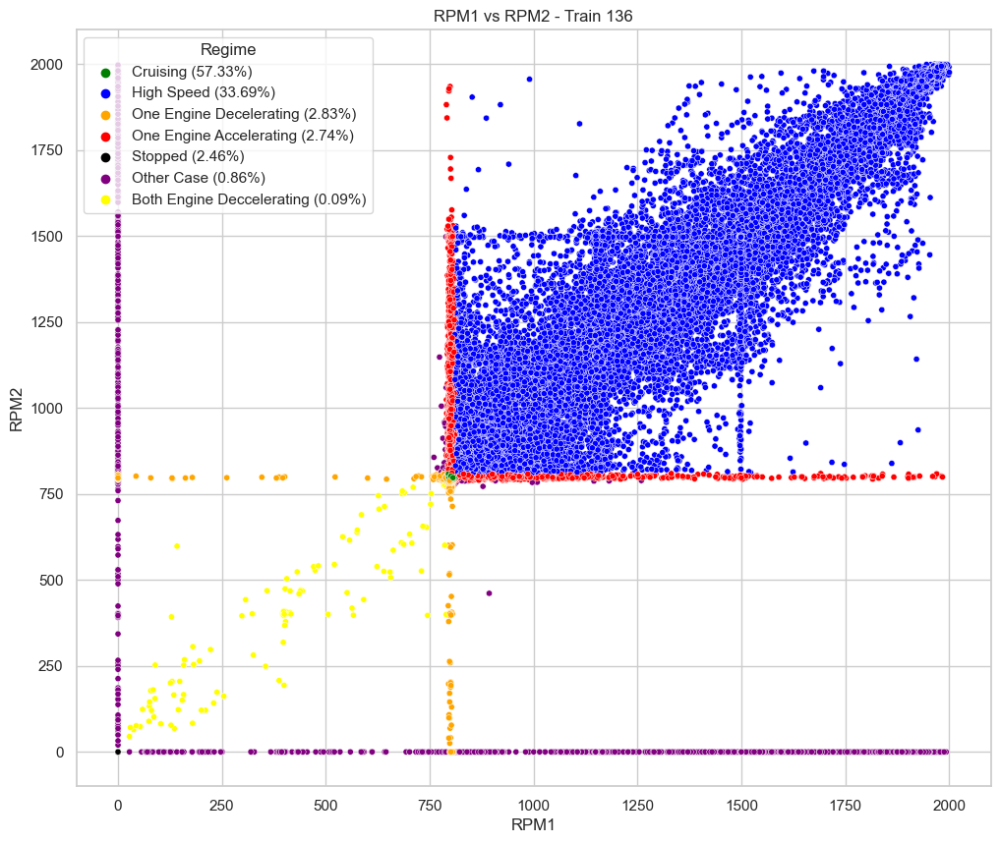

In [75]:
import matplotlib.pyplot as plt
import seaborn as sns

custom_palette = {'Cruising': 'green', 'High Speed': 'blue', 'One Engine Decelerating': 'orange', 'One Engine Accelerating': 'red',
                  'Stopped': 'black', 'Other Case': 'purple', 'Both Engine Deccelerating': 'yellow'}

# Assuming df_time is your DataFrame with the 'RS_E_RPM_PC1' and 'RS_E_RPM_PC2' columns
plt.figure(figsize=(12, 10))
scatter_plot = sns.scatterplot(data=df_time, x='RS_E_RPM_PC1', y='RS_E_RPM_PC2', hue='Regime', palette=custom_palette, s=20)

# Calculate percentage of points for each regime
regime_percentages = df_time['Regime'].value_counts(normalize=True) * 100

# Convert percentages to string format
percentage_labels = [f'{regime} ({percentage:.2f}%)' for regime, percentage in regime_percentages.items()]

# Get legend handles and labels in the correct order
handles, labels = scatter_plot.get_legend_handles_labels()
order = [labels.index(label) for label in custom_palette.keys()]
handles = [handles[i] for i in order]
labels = [labels[i] for i in order]

# Set legend with correct order of handles and labels
scatter_plot.legend(title='Regime', handles=handles, labels=percentage_labels, loc='upper left')

plt.title('RPM1 vs RPM2 - Train 136')
plt.xlabel('RPM1')
plt.ylabel('RPM2')
plt.show()


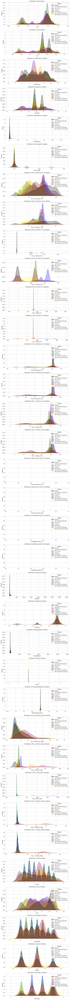

In [77]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Assuming df is your DataFrame with 'Regime' and other features
# Create a list of features to visualize
features_to_visualize = df_time.columns[:-1]

# Set the style of seaborn
sns.set(style="whitegrid")

# Set up the matplotlib figure
fig, axes = plt.subplots(len(features_to_visualize), 1, figsize=(10, 4 * len(features_to_visualize)))

# Iterate through each feature and create subplots
for i, feature in enumerate(features_to_visualize):
    # Create a subplot for each feature
    ax = axes[i]

    # Use Seaborn's kdeplot to plot KDE densities based on the 'Regime' column
    sns.kdeplot(data=df_time, x=feature, hue='Regime', fill=True, common_norm=False, palette=custom_palette, ax=ax)

    # Add labels and title to the subplot
    ax.set_title(f'Distribution of {feature} by Regime')
    ax.set_xlabel(feature)
    ax.set_ylabel('Density')

# Adjust layout
plt.tight_layout()
plt.show()


# Testing a method to detect anomalies based on the Kerned Density Estimation 

In [80]:
from sklearn.neighbors import KernelDensity

# Assuming df is your DataFrame with 'Regime' and features
feature_to_check = 'RS_E_OilPress_Delta'  # Replace with the actual feature name

# Iterate through each regime and fit KDE model
for regime, data in df_time.groupby('Regime'):
    kde_model = KernelDensity(bandwidth=0.5)  # Adjust bandwidth as needed
    kde_model.fit(data[[feature_to_check]])

    # Calculate log likelihoods for each data point
    log_likelihoods = kde_model.score_samples(data[[feature_to_check]])

    # Assign log likelihoods to the DataFrame
    df_time.loc[data.index, 'LogLikelihood'] = log_likelihoods

# Set a threshold for anomaly detection
threshold = -5  # Adjust as needed

# Identify anomalies based on the threshold
anomalies = df_time[df_time['LogLikelihood'] < threshold]

# Display or further analyze the anomalies
print(anomalies)